# Maritime Location Prediction using Bidirectional GRU Neural Network

In this jupyer notebook, we will preprocess position and trajectory data of vessels, which was collected with the help of the antenna located on the roof of University of Piraeus, Central Building and we will train a neural network using masking layer, and biderctional GRU **to achieve a RMSE loss of 17.48 meters for our predictions to the true locations.**

Let's start by importing the needed libraries and the datasets.

In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import numpy as np
import pandas as pd
import geopandas as gpd

In [3]:
trips =pd.read_csv('trips.csv')
trajectories = pd.read_csv('trajectories.csv')

In [4]:
trajectories

,Unnamed: 0,trajectory_id,vessel_id,start_time,end_time,status
0,0,1,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-01 02:52:35,2019-08-01 13:28:36,1
1,1,2,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-01 13:28:36,2019-08-01 13:40:36,0
2,2,3,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-01 13:40:36,2019-08-01 13:58:37,1
3,3,4,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-01 13:58:37,2019-08-01 16:28:36,0
4,4,5,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-01 16:28:36,2019-08-01 17:22:36,1
...,...,...,...,...,...,...
90543,90543,90544,fe5e06055a5764c8cb5f844002c56075da04807ceb739f...,2019-08-29 15:34:46,2019-08-29 22:47:45,1
90544,90544,90545,fe5e06055a5764c8cb5f844002c56075da04807ceb739f...,2019-08-29 22:47:45,2019-08-29 22:53:45,0
90545,90545,90546,fe5e06055a5764c8cb5f844002c56075da04807ceb739f...,2019-08-29 22:53:45,2019-08-30 01:22:49,1
90546,90546,90547,fe5e06055a5764c8cb5f844002c56075da04807ceb739f...,2019-08-30 01:22:49,2019-08-30 01:25:48,0


In [5]:
positions = pd.read_csv('cleaned_data.csv')
positions

,Unnamed: 0,id_x,vessel_id,t,lon,lat,heading,course,speed,location_geometry,...,geom,Δs,Δt,velocity,velocity in knots,type,speed_max,Status,geometry,port_code
0,0,56775,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-01 02:52:35,23.53248,38.02678,11.0,256.9,0.0,0101000020E61000002AC6F99B50883740EC17EC866D03...,...,POINT (458818.04814661463 4208601.550547703),NaN,NaN,NaN,NaN,89,20,1,POINT (458818.04814661463 4208601.550547703),NaN
1,1,104599,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-01 06:10:36,23.53245,38.02678,10.0,302.7,0.0,0101000020E610000055C1A8A44E883740EC17EC866D03...,...,POINT (458815.4151503135 4208601.563782826),2.633030,11881.0,0.000222,0.000431,89,20,1,POINT (458815.4151503135 4208601.563782826),NaN
2,2,197026,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-01 10:28:35,23.53255,38.02612,335.0,266.9,0.0,0101000020E61000001C7C613255883740C1E270E65703...,...,POINT (458823.8237752401 4208528.29000446),73.754672,15479.0,0.004765,0.009262,89,20,1,POINT (458823.8237752401 4208528.29000446),NaN
3,3,226340,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-01 12:10:37,23.53175,38.02600,28.0,243.4,0.0,0101000020E6100000E3A59BC42088374017D9CEF75303...,...,POINT (458753.5428815002 4208515.328692883),71.466073,6122.0,0.011674,0.022692,89,20,1,POINT (458753.5428815002 4208515.328692883),NaN
4,4,249045,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-01 13:28:36,23.53196,38.02584,22.0,191.8,0.2,0101000020E6100000B9C7D2872E883740DE76A1B94E03...,...,POINT (458771.8847206099 4208497.483282045),25.590657,4679.0,0.005469,0.010631,89,20,0,POINT (458771.8847206099 4208497.483282045),NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3607374,3607374,5859936,fe5e06055a5764c8cb5f844002c56075da04807ceb739f...,2019-08-30 07:57:50,23.55053,37.95165,NaN,NaN,0.0,0101000020E61000008577B988EF8C3740849ECDAACFF9...,...,POINT (460361.98500009836 4200257.822513809),2.859729,484.0,0.005909,0.011485,31,12,1,POINT (460361.98500009836 4200257.822513809),NaN
3607375,3607375,5889723,fe5e06055a5764c8cb5f844002c56075da04807ceb739f...,2019-08-30 08:05:47,23.55050,37.95161,NaN,NaN,0.0,0101000020E6100000B0726891ED8C3740F645425BCEF9...,...,POINT (460359.32790669496 4200253.397127294),5.161801,477.0,0.010821,0.021035,31,12,1,POINT (460359.32790669496 4200253.397127294),NaN
3607376,3607376,5889755,fe5e06055a5764c8cb5f844002c56075da04807ceb739f...,2019-08-30 08:05:52,23.55051,37.95161,NaN,NaN,0.0,0101000020E6100000F71E2E39EE8C3740F645425BCEF9...,...,POINT (460360.2064675885 4200253.3928886205),0.878571,5.0,0.175714,0.341561,31,12,1,POINT (460360.2064675885 4200253.3928886205),NaN
3607377,3607377,5765467,fe5e06055a5764c8cb5f844002c56075da04807ceb739f...,2019-08-30 22:22:50,23.55042,37.95174,NaN,NaN,0.0,0101000020E610000077103B53E88C3740C425C79DD2F9...,...,POINT (460352.3690214858 4200267.854872565),16.449150,51418.0,0.000320,0.000622,31,12,1,POINT (460352.3690214858 4200267.854872565),NaN


# Data Pre-Processing

In [6]:
trajectories.dtypes

Unnamed: 0        int64
trajectory_id     int64
vessel_id        object
start_time       object
end_time         object
status            int64
dtype: object

It seems that we'll need to convert the start_time & end_time to datetime.

In [7]:
trajectories['start_time'] = pd.to_datetime(trajectories['start_time'])
trajectories['end_time'] = pd.to_datetime(trajectories['end_time'])

In [8]:
trajectories.dtypes

Unnamed: 0                int64
trajectory_id             int64
vessel_id                object
start_time       datetime64[ns]
end_time         datetime64[ns]
status                    int64
dtype: object

In [9]:
trajectories['status'].value_counts()

0    43092
1    41085
5     4340
8     2025
7        6
Name: status, dtype: int64

We don't care about trajectories of status 1 & 5 because we want to have moving vessels only. The navigational status is set from the csv creators with the help of MarineTraffic guidebook for Navigational Status in the following link: https://help.marinetraffic.com/hc/en-us/articles/203990998-What-is-the-significance-of-the-AIS-Navigational-Status-Values- 

In [10]:
trajectories = trajectories[(trajectories['status'] != 1 )& (trajectories['status'] != 5 )]
trajectories['status'].value_counts()

0    43092
8     2025
7        6
Name: status, dtype: int64

Let's now load the vessel position data.

Clean the columns we won't need.

In [11]:
positions.drop(columns=['geom','geometry','location_geometry','Unnamed: 0'], inplace=True)
positions

,id_x,vessel_id,t,lon,lat,heading,course,speed,distance_in_meters,Δs,Δt,velocity,velocity in knots,type,speed_max,Status,port_code
0,56775,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-01 02:52:35,23.53248,38.02678,11.0,256.9,0.0,13646.902437,NaN,NaN,NaN,NaN,89,20,1,NaN
1,104599,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-01 06:10:36,23.53245,38.02678,10.0,302.7,0.0,13648.848561,2.633030,11881.0,0.000222,0.000431,89,20,1,NaN
2,197026,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-01 10:28:35,23.53255,38.02612,335.0,266.9,0.0,13593.123862,73.754672,15479.0,0.004765,0.009262,89,20,1,NaN
3,226340,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-01 12:10:37,23.53175,38.02600,28.0,243.4,0.0,13636.377957,71.466073,6122.0,0.011674,0.022692,89,20,1,NaN
4,249045,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-01 13:28:36,23.53196,38.02584,22.0,191.8,0.2,13610.803373,25.590657,4679.0,0.005469,0.010631,89,20,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3607374,5859936,fe5e06055a5764c8cb5f844002c56075da04807ceb739f...,2019-08-30 07:57:50,23.55053,37.95165,NaN,NaN,0.0,8543.332107,2.859729,484.0,0.005909,0.011485,31,12,1,NaN
3607375,5889723,fe5e06055a5764c8cb5f844002c56075da04807ceb739f...,2019-08-30 08:05:47,23.55050,37.95161,NaN,NaN,0.0,8545.509664,5.161801,477.0,0.010821,0.021035,31,12,1,NaN
3607376,5889755,fe5e06055a5764c8cb5f844002c56075da04807ceb739f...,2019-08-30 08:05:52,23.55051,37.95161,NaN,NaN,0.0,8544.635494,0.878571,5.0,0.175714,0.341561,31,12,1,NaN
3607377,5765467,fe5e06055a5764c8cb5f844002c56075da04807ceb739f...,2019-08-30 22:22:50,23.55042,37.95174,NaN,NaN,0.0,8553.955830,16.449150,51418.0,0.000320,0.000622,31,12,1,NaN


We will only keep the vessels that appeared in **Piraeus Port, which is the port with code 23** and the **type of these vessels are 60-69, which is the passenger vessels.**

In [12]:
piraeus_passengers = list(positions[(positions['port_code'] == 23) & (positions['type'] >= 60) & (positions['type'] <= 69)]['vessel_id'].unique())

Keep the vessel position with velocity in knots within the range (1,50), because we want them to be sure that they moving and also it is very rare to have vessels with velocity more than 50 knots.

In [13]:
positions= positions.loc[positions['velocity in knots'].between(1,50, inclusive='neither')].copy()
positions

,id_x,vessel_id,t,lon,lat,heading,course,speed,distance_in_meters,Δs,Δt,velocity,velocity in knots,type,speed_max,Status,port_code
120,10344014,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:40:33,23.56790,38.02167,76.0,72.8,3.3,11094.892374,3109.852961,2517.0,1.235540,2.401697,89,20,0,NaN
121,8140532,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:43:10,23.57181,38.02237,82.0,80.0,5.2,10944.142820,351.871533,157.0,2.241220,4.356583,89,20,0,NaN
122,8141543,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:46:47,23.57881,38.02314,86.0,83.4,5.7,10653.632960,620.316558,217.0,2.858602,5.556677,89,20,0,NaN
123,8141644,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:47:06,23.57947,38.02319,86.0,84.1,5.6,10625.626131,58.194309,19.0,3.062858,5.953720,89,20,0,NaN
124,9730235,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:47:19,23.57990,38.02323,86.0,83.9,5.7,10608.195016,38.001828,13.0,2.923218,5.682280,89,20,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3601046,6164976,fe2993bd44e223ba52000b0440c9bb8d353ac60c70652a...,2019-08-17 09:24:44,23.68101,37.93135,136.0,156.8,1.9,3274.247313,16.890112,19.0,0.888953,1.727987,37,30,5,7.0
3601048,6165245,fe2993bd44e223ba52000b0440c9bb8d353ac60c70652a...,2019-08-17 09:25:41,23.68090,37.93125,82.0,248.0,1.2,3270.234425,13.595826,20.0,0.679791,1.321409,37,30,5,7.0
3601049,6165292,fe2993bd44e223ba52000b0440c9bb8d353ac60c70652a...,2019-08-17 09:25:51,23.68081,37.93123,78.0,252.2,1.5,3264.042584,8.214644,10.0,0.821464,1.596799,37,30,5,7.0
3601050,6165328,fe2993bd44e223ba52000b0440c9bb8d353ac60c70652a...,2019-08-17 09:25:59,23.68072,37.93121,75.0,251.2,1.7,3257.859680,8.214646,8.0,1.026831,1.995999,37,30,5,7.0


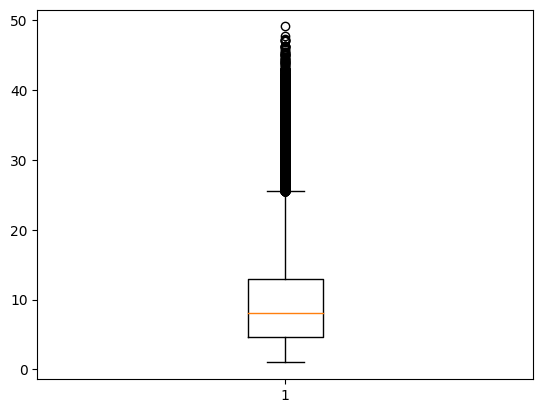

In [14]:
import matplotlib.pyplot as plt

plt.boxplot( positions['velocity in knots'])
plt.show()

We will drop as outliers, the positions where the vessels had over 30 knots speed, because we can see that most of the vessels have speed under 30 knots:

In [15]:
pos_moving = positions.loc[positions['velocity in knots'].between(1,30, inclusive='neither')].copy()
pos_moving

,id_x,vessel_id,t,lon,lat,heading,course,speed,distance_in_meters,Δs,Δt,velocity,velocity in knots,type,speed_max,Status,port_code
120,10344014,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:40:33,23.56790,38.02167,76.0,72.8,3.3,11094.892374,3109.852961,2517.0,1.235540,2.401697,89,20,0,NaN
121,8140532,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:43:10,23.57181,38.02237,82.0,80.0,5.2,10944.142820,351.871533,157.0,2.241220,4.356583,89,20,0,NaN
122,8141543,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:46:47,23.57881,38.02314,86.0,83.4,5.7,10653.632960,620.316558,217.0,2.858602,5.556677,89,20,0,NaN
123,8141644,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:47:06,23.57947,38.02319,86.0,84.1,5.6,10625.626131,58.194309,19.0,3.062858,5.953720,89,20,0,NaN
124,9730235,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:47:19,23.57990,38.02323,86.0,83.9,5.7,10608.195016,38.001828,13.0,2.923218,5.682280,89,20,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3601046,6164976,fe2993bd44e223ba52000b0440c9bb8d353ac60c70652a...,2019-08-17 09:24:44,23.68101,37.93135,136.0,156.8,1.9,3274.247313,16.890112,19.0,0.888953,1.727987,37,30,5,7.0
3601048,6165245,fe2993bd44e223ba52000b0440c9bb8d353ac60c70652a...,2019-08-17 09:25:41,23.68090,37.93125,82.0,248.0,1.2,3270.234425,13.595826,20.0,0.679791,1.321409,37,30,5,7.0
3601049,6165292,fe2993bd44e223ba52000b0440c9bb8d353ac60c70652a...,2019-08-17 09:25:51,23.68081,37.93123,78.0,252.2,1.5,3264.042584,8.214644,10.0,0.821464,1.596799,37,30,5,7.0
3601050,6165328,fe2993bd44e223ba52000b0440c9bb8d353ac60c70652a...,2019-08-17 09:25:59,23.68072,37.93121,75.0,251.2,1.7,3257.859680,8.214646,8.0,1.026831,1.995999,37,30,5,7.0


We will create a GeoDataframe in **crs = 4326** and then transform it to **crs = 2100** because we want to have it in Greek CRS where the coordinates are calclulated in meters. We will use the meter calculated coordinates to then create a loss function in our neural network that calclulates the loss as the **Euclidean Distance** between the prediction and the real position.

In [16]:
gdf = gpd.GeoDataFrame(pos_moving, geometry=gpd.points_from_xy(pos_moving['lon'], pos_moving['lat']), crs=4326)
gdf

,id_x,vessel_id,t,lon,lat,heading,course,speed,distance_in_meters,Δs,Δt,velocity,velocity in knots,type,speed_max,Status,port_code,geometry
120,10344014,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:40:33,23.56790,38.02167,76.0,72.8,3.3,11094.892374,3109.852961,2517.0,1.235540,2.401697,89,20,0,NaN,POINT (23.56790 38.02167)
121,8140532,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:43:10,23.57181,38.02237,82.0,80.0,5.2,10944.142820,351.871533,157.0,2.241220,4.356583,89,20,0,NaN,POINT (23.57181 38.02237)
122,8141543,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:46:47,23.57881,38.02314,86.0,83.4,5.7,10653.632960,620.316558,217.0,2.858602,5.556677,89,20,0,NaN,POINT (23.57881 38.02314)
123,8141644,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:47:06,23.57947,38.02319,86.0,84.1,5.6,10625.626131,58.194309,19.0,3.062858,5.953720,89,20,0,NaN,POINT (23.57947 38.02319)
124,9730235,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:47:19,23.57990,38.02323,86.0,83.9,5.7,10608.195016,38.001828,13.0,2.923218,5.682280,89,20,0,NaN,POINT (23.57990 38.02323)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3601046,6164976,fe2993bd44e223ba52000b0440c9bb8d353ac60c70652a...,2019-08-17 09:24:44,23.68101,37.93135,136.0,156.8,1.9,3274.247313,16.890112,19.0,0.888953,1.727987,37,30,5,7.0,POINT (23.68101 37.93135)
3601048,6165245,fe2993bd44e223ba52000b0440c9bb8d353ac60c70652a...,2019-08-17 09:25:41,23.68090,37.93125,82.0,248.0,1.2,3270.234425,13.595826,20.0,0.679791,1.321409,37,30,5,7.0,POINT (23.68090 37.93125)
3601049,6165292,fe2993bd44e223ba52000b0440c9bb8d353ac60c70652a...,2019-08-17 09:25:51,23.68081,37.93123,78.0,252.2,1.5,3264.042584,8.214644,10.0,0.821464,1.596799,37,30,5,7.0,POINT (23.68081 37.93123)
3601050,6165328,fe2993bd44e223ba52000b0440c9bb8d353ac60c70652a...,2019-08-17 09:25:59,23.68072,37.93121,75.0,251.2,1.7,3257.859680,8.214646,8.0,1.026831,1.995999,37,30,5,7.0,POINT (23.68072 37.93121)


In [17]:
gdf = gdf.to_crs('EPSG:2100')
gdf

,id_x,vessel_id,t,lon,lat,heading,course,speed,distance_in_meters,Δs,Δt,velocity,velocity in knots,type,speed_max,Status,port_code,geometry
120,10344014,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:40:33,23.56790,38.02167,76.0,72.8,3.3,11094.892374,3109.852961,2517.0,1.235540,2.401697,89,20,0,NaN,POINT (461924.103 4208019.542)
121,8140532,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:43:10,23.57181,38.02237,82.0,80.0,5.2,10944.142820,351.871533,157.0,2.241220,4.356583,89,20,0,NaN,POINT (462267.652 4208095.623)
122,8141543,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:46:47,23.57881,38.02314,86.0,83.4,5.7,10653.632960,620.316558,217.0,2.858602,5.556677,89,20,0,NaN,POINT (462882.440 4208178.253)
123,8141644,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:47:06,23.57947,38.02319,86.0,84.1,5.6,10625.626131,58.194309,19.0,3.062858,5.953720,89,20,0,NaN,POINT (462940.394 4208183.538)
124,9730235,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:47:19,23.57990,38.02323,86.0,83.9,5.7,10608.195016,38.001828,13.0,2.923218,5.682280,89,20,0,NaN,POINT (462978.155 4208187.806)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3601046,6164976,fe2993bd44e223ba52000b0440c9bb8d353ac60c70652a...,2019-08-17 09:24:44,23.68101,37.93135,136.0,156.8,1.9,3274.247313,16.890112,19.0,0.888953,1.727987,37,30,5,7.0,POINT (471817.709 4197958.222)
3601048,6165245,fe2993bd44e223ba52000b0440c9bb8d353ac60c70652a...,2019-08-17 09:25:41,23.68090,37.93125,82.0,248.0,1.2,3270.234425,13.595826,20.0,0.679791,1.321409,37,30,5,7.0,POINT (471808.004 4197947.160)
3601049,6165292,fe2993bd44e223ba52000b0440c9bb8d353ac60c70652a...,2019-08-17 09:25:51,23.68081,37.93123,78.0,252.2,1.5,3264.042584,8.214644,10.0,0.821464,1.596799,37,30,5,7.0,POINT (471800.087 4197944.968)
3601050,6165328,fe2993bd44e223ba52000b0440c9bb8d353ac60c70652a...,2019-08-17 09:25:59,23.68072,37.93121,75.0,251.2,1.7,3257.859680,8.214646,8.0,1.026831,1.995999,37,30,5,7.0,POINT (471792.170 4197942.776)


In [18]:
gdf['longitude'] = gdf.geometry.x
gdf['latitude'] = gdf.geometry.y
gdf

,id_x,vessel_id,t,lon,lat,heading,course,speed,distance_in_meters,Δs,Δt,velocity,velocity in knots,type,speed_max,Status,port_code,geometry,longitude,latitude
120,10344014,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:40:33,23.56790,38.02167,76.0,72.8,3.3,11094.892374,3109.852961,2517.0,1.235540,2.401697,89,20,0,NaN,POINT (461924.103 4208019.542),461924.103437,4.208020e+06
121,8140532,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:43:10,23.57181,38.02237,82.0,80.0,5.2,10944.142820,351.871533,157.0,2.241220,4.356583,89,20,0,NaN,POINT (462267.652 4208095.623),462267.651542,4.208096e+06
122,8141543,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:46:47,23.57881,38.02314,86.0,83.4,5.7,10653.632960,620.316558,217.0,2.858602,5.556677,89,20,0,NaN,POINT (462882.440 4208178.253),462882.440141,4.208178e+06
123,8141644,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:47:06,23.57947,38.02319,86.0,84.1,5.6,10625.626131,58.194309,19.0,3.062858,5.953720,89,20,0,NaN,POINT (462940.394 4208183.538),462940.393916,4.208184e+06
124,9730235,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:47:19,23.57990,38.02323,86.0,83.9,5.7,10608.195016,38.001828,13.0,2.923218,5.682280,89,20,0,NaN,POINT (462978.155 4208187.806),462978.155357,4.208188e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3601046,6164976,fe2993bd44e223ba52000b0440c9bb8d353ac60c70652a...,2019-08-17 09:24:44,23.68101,37.93135,136.0,156.8,1.9,3274.247313,16.890112,19.0,0.888953,1.727987,37,30,5,7.0,POINT (471817.709 4197958.222),471817.708828,4.197958e+06
3601048,6165245,fe2993bd44e223ba52000b0440c9bb8d353ac60c70652a...,2019-08-17 09:25:41,23.68090,37.93125,82.0,248.0,1.2,3270.234425,13.595826,20.0,0.679791,1.321409,37,30,5,7.0,POINT (471808.004 4197947.160),471808.004058,4.197947e+06
3601049,6165292,fe2993bd44e223ba52000b0440c9bb8d353ac60c70652a...,2019-08-17 09:25:51,23.68081,37.93123,78.0,252.2,1.5,3264.042584,8.214644,10.0,0.821464,1.596799,37,30,5,7.0,POINT (471800.087 4197944.968),471800.087259,4.197945e+06
3601050,6165328,fe2993bd44e223ba52000b0440c9bb8d353ac60c70652a...,2019-08-17 09:25:59,23.68072,37.93121,75.0,251.2,1.7,3257.859680,8.214646,8.0,1.026831,1.995999,37,30,5,7.0,POINT (471792.170 4197942.776),471792.170456,4.197943e+06


Drop the vessel positions of status 1 & 5, beause we only want vessels that are moving for our location prediction problem (check the statuse here: https://help.marinetraffic.com/hc/en-us/articles/203990998-What-is-the-significance-of-the-AIS-Navigational-Status-Values-)

In [19]:
gdf = gdf[(gdf['Status'] != 1 ) & (gdf['Status'] != 5 )]
gdf.drop(columns=['lon','lat'], inplace = True)
gdf

,id_x,vessel_id,t,heading,course,speed,distance_in_meters,Δs,Δt,velocity,velocity in knots,type,speed_max,Status,port_code,geometry,longitude,latitude
120,10344014,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:40:33,76.0,72.8,3.3,11094.892374,3109.852961,2517.0,1.235540,2.401697,89,20,0,NaN,POINT (461924.103 4208019.542),461924.103437,4.208020e+06
121,8140532,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:43:10,82.0,80.0,5.2,10944.142820,351.871533,157.0,2.241220,4.356583,89,20,0,NaN,POINT (462267.652 4208095.623),462267.651542,4.208096e+06
122,8141543,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:46:47,86.0,83.4,5.7,10653.632960,620.316558,217.0,2.858602,5.556677,89,20,0,NaN,POINT (462882.440 4208178.253),462882.440141,4.208178e+06
123,8141644,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:47:06,86.0,84.1,5.6,10625.626131,58.194309,19.0,3.062858,5.953720,89,20,0,NaN,POINT (462940.394 4208183.538),462940.393916,4.208184e+06
124,9730235,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-05 12:47:19,86.0,83.9,5.7,10608.195016,38.001828,13.0,2.923218,5.682280,89,20,0,NaN,POINT (462978.155 4208187.806),462978.155357,4.208188e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3601013,6162910,fe2993bd44e223ba52000b0440c9bb8d353ac60c70652a...,2019-08-17 09:18:11,55.0,50.0,11.2,2632.332095,33.792258,6.0,5.632043,10.947816,37,30,0,NaN,POINT (471107.748 4197991.750),471107.748329,4.197992e+06
3601014,6162966,fe2993bd44e223ba52000b0440c9bb8d353ac60c70652a...,2019-08-17 09:18:23,56.0,50.0,10.7,2654.202701,65.473586,12.0,5.456132,10.605872,37,30,0,NaN,POINT (471157.987 4198033.736),471157.987366,4.198034e+06
3601015,6162995,fe2993bd44e223ba52000b0440c9bb8d353ac60c70652a...,2019-08-17 09:18:30,55.0,50.1,10.5,2667.285865,36.519949,7.0,5.217136,10.141300,37,30,0,NaN,POINT (471186.190 4198056.937),471186.190218,4.198057e+06
3601016,6163025,fe2993bd44e223ba52000b0440c9bb8d353ac60c70652a...,2019-08-17 09:18:35,55.0,50.1,10.4,2676.234683,25.510142,5.0,5.102028,9.917550,37,30,0,NaN,POINT (471205.582 4198073.512),471205.581768,4.198074e+06


In [20]:
gdf.port_code.value_counts()

Series([], Name: port_code, dtype: int64)

Every vessel position is out of port, in the open sea.

In [21]:
gdf.dtypes

id_x                     int64
vessel_id               object
t                       object
heading                float64
course                 float64
speed                  float64
distance_in_meters     float64
Δs                     float64
Δt                     float64
velocity               float64
velocity in knots      float64
type                     int64
speed_max                int64
Status                   int64
port_code              float64
geometry              geometry
longitude              float64
latitude               float64
dtype: object

Make the timestamp t datetime:

In [22]:
gdf['t'] = pd.to_datetime(gdf['t'])
gdf.dtypes

id_x                           int64
vessel_id                     object
t                     datetime64[ns]
heading                      float64
course                       float64
speed                        float64
distance_in_meters           float64
Δs                           float64
Δt                           float64
velocity                     float64
velocity in knots            float64
type                           int64
speed_max                      int64
Status                         int64
port_code                    float64
geometry                    geometry
longitude                    float64
latitude                     float64
dtype: object

Let's keep only the trajectories that have a start and an end time.

In [23]:
filtered_trajectories = trajectories[(~trajectories['start_time'].isna()) & (~trajectories['end_time'].isna())]
filtered_trajectories.drop(columns=['Unnamed: 0'], inplace=True)
filtered_trajectories

,trajectory_id,vessel_id,start_time,end_time,status
1,2,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-01 13:28:36,2019-08-01 13:40:36,0
3,4,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-01 13:58:37,2019-08-01 16:28:36,0
5,6,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-01 17:22:36,2019-08-01 18:04:36,0
7,8,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-01 18:43:37,2019-08-01 19:46:36,0
9,10,002351f7584dcb3b6ab87557073727eadd310a71e141d3...,2019-08-01 20:13:37,2019-08-01 20:25:37,0
...,...,...,...,...,...
90538,90539,fe5e06055a5764c8cb5f844002c56075da04807ceb739f...,2019-08-29 10:07:45,2019-08-29 10:07:50,0
90540,90541,fe5e06055a5764c8cb5f844002c56075da04807ceb739f...,2019-08-29 15:21:47,2019-08-29 15:27:46,0
90542,90543,fe5e06055a5764c8cb5f844002c56075da04807ceb739f...,2019-08-29 15:30:46,2019-08-29 15:34:46,0
90544,90545,fe5e06055a5764c8cb5f844002c56075da04807ceb739f...,2019-08-29 22:47:45,2019-08-29 22:53:45,0


Now keep only the **positions of the vessels that appeared in the Piraeus Port.**

In [194]:
gdf_passenger = gdf[gdf['vessel_id'].isin(piraeus_passengers)]
gdf_passenger

,id_x,vessel_id,t,heading,course,speed,distance_in_meters,Δs,Δt,velocity,velocity in knots,type,speed_max,Status,port_code,geometry,longitude,latitude
52426,262719,08532cbd7297e77dca5c6d333376e2eb13ef3475cac18b...,2019-08-01 14:18:26,336.0,334.8,24.6,15734.880935,617.294130,48.0,12.860294,24.998412,69,25,0,NaN,POINT (471982.827 4183936.676),471982.827160,4.183937e+06
52427,263272,08532cbd7297e77dca5c6d333376e2eb13ef3475cac18b...,2019-08-01 14:20:30,338.0,337.0,24.7,14206.179172,1568.753165,124.0,12.651235,24.592034,69,25,0,NaN,POINT (471350.456 4185372.327),471350.455665,4.185372e+06
52428,263451,08532cbd7297e77dca5c6d333376e2eb13ef3475cac18b...,2019-08-01 14:21:10,339.0,337.3,24.6,13712.582650,506.668293,40.0,12.666707,24.622109,69,25,0,NaN,POINT (471153.168 4185839.007),471153.168337,4.185839e+06
52429,263793,08532cbd7297e77dca5c6d333376e2eb13ef3475cac18b...,2019-08-01 14:22:26,339.0,337.5,24.5,12773.215007,963.246539,76.0,12.674297,24.636862,69,25,0,NaN,POINT (470792.840 4186732.320),470792.840494,4.186732e+06
52430,263831,08532cbd7297e77dca5c6d333376e2eb13ef3475cac18b...,2019-08-01 14:22:34,339.0,337.6,24.6,12675.298734,100.587435,8.0,12.573429,24.440792,69,25,0,NaN,POINT (470755.330 4186825.651),470755.330225,4.186826e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3519904,5882371,f6bc7f1c524e9ddb5ebee6ea1012f54502556638891b60...,2019-08-30 07:46:28,NaN,155.0,16.6,15783.311700,409.684764,48.0,8.535099,16.590906,60,25,0,NaN,POINT (467685.651 4183618.388),467685.650936,4.183618e+06
3519905,5882692,f6bc7f1c524e9ddb5ebee6ea1012f54502556638891b60...,2019-08-30 07:47:16,NaN,156.0,16.6,16149.147832,411.589054,48.0,8.574772,16.668023,60,25,0,NaN,POINT (467848.807 4183240.518),467848.807310,4.183241e+06
3519906,5882907,f6bc7f1c524e9ddb5ebee6ea1012f54502556638891b60...,2019-08-30 07:47:52,NaN,156.0,16.8,16432.799387,315.057867,36.0,8.751607,17.011764,60,25,0,NaN,POINT (467969.174 4182949.359),467969.173565,4.182949e+06
3519907,5884171,f6bc7f1c524e9ddb5ebee6ea1012f54502556638891b60...,2019-08-30 07:51:04,NaN,157.0,17.0,17949.402714,1674.988668,192.0,8.723899,16.957904,60,25,0,NaN,POINT (468629.817 4181410.159),468629.816829,4.181410e+06


Drop the rows with null course, because this feature is important for the location prediction.

In [189]:
gdf_passenger['course'].isna().sum()

5

In [195]:
gdf_passenger.dropna(subset=['course'],inplace= True)

In [198]:
gdf_passenger['course'].isna().sum()

0

In [199]:
len(piraeus_passengers)

35

We have 35 unique vessels, lets plot a sample of these positions.

In [200]:
gdf_passenger[['latitude','geometry']].sample(30000).explore()

We can see that the trajectories seem to be moving from Piraeus to 3 main routes and back. Let's now keep only the trajectories of these specific 35 vessels.

In [201]:
trajectories_pass = filtered_trajectories[filtered_trajectories['vessel_id'].isin(piraeus_passengers)]
trajectories_pass

,trajectory_id,vessel_id,start_time,end_time,status
4409,4410,08532cbd7297e77dca5c6d333376e2eb13ef3475cac18b...,2019-08-01 14:17:38,2019-08-01 14:45:18,0
4411,4412,08532cbd7297e77dca5c6d333376e2eb13ef3475cac18b...,2019-08-01 17:40:29,2019-08-02 14:43:26,0
4413,4414,08532cbd7297e77dca5c6d333376e2eb13ef3475cac18b...,2019-08-02 17:40:11,2019-08-03 14:43:21,0
4415,4416,08532cbd7297e77dca5c6d333376e2eb13ef3475cac18b...,2019-08-03 17:39:04,2019-08-04 14:51:25,0
4417,4418,08532cbd7297e77dca5c6d333376e2eb13ef3475cac18b...,2019-08-04 17:46:46,2019-08-05 14:48:30,0
...,...,...,...,...,...
88954,88955,f6bc7f1c524e9ddb5ebee6ea1012f54502556638891b60...,2019-08-18 07:16:46,2019-08-18 22:26:30,0
88956,88957,f6bc7f1c524e9ddb5ebee6ea1012f54502556638891b60...,2019-08-19 07:15:21,2019-08-26 23:38:22,0
88958,88959,f6bc7f1c524e9ddb5ebee6ea1012f54502556638891b60...,2019-08-27 07:14:24,2019-08-27 22:15:42,0
88960,88961,f6bc7f1c524e9ddb5ebee6ea1012f54502556638891b60...,2019-08-28 07:14:13,2019-08-28 22:14:27,0


In [202]:
trajectories_pass = trajectories_pass.sample(frac=1) # shuffle the dataframe
trajectories_pass.reset_index(drop= True, inplace=True)
trajectories_pass

,trajectory_id,vessel_id,start_time,end_time,status
0,35481,490201f75b5ddc3766b08b79c84ff3ff6f3737c31a8906...,2019-08-16 10:06:03,2019-08-16 15:52:11,0
1,69697,bfca0e846b6d35f8fde7611da7ff55835ba71a7eda53d3...,2019-08-08 15:41:05,2019-08-08 19:08:22,0
2,71735,c300c18593ef197722498c64998de8d226928ad5b3c81e...,2019-08-01 04:03:39,2019-08-01 04:31:02,0
3,13729,11e59aaa59860630711db1173860c9b322292d9da5a331...,2019-08-06 18:37:18,2019-08-07 08:51:50,0
4,69604,be22334af2d541852c6f34e3ddec52975fe0ddf55b857e...,2019-08-05 03:28:44,2019-08-05 04:18:25,0
...,...,...,...,...,...
597,4424,08532cbd7297e77dca5c6d333376e2eb13ef3475cac18b...,2019-08-07 17:39:21,2019-08-08 14:41:45,0
598,69699,bfca0e846b6d35f8fde7611da7ff55835ba71a7eda53d3...,2019-08-09 09:21:36,2019-08-09 12:44:54,0
599,41812,5de00399a2fdba5f2eb761a622a79a73af9d4058d51e6b...,2019-08-07 17:36:52,2019-08-07 20:55:48,0
600,41818,5de00399a2fdba5f2eb761a622a79a73af9d4058d51e6b...,2019-08-09 15:42:00,2019-08-09 19:06:48,0


We will create a trajectory generator, which we'll use to enter every position sub gdf of each trajectory in a column named segments.

In [203]:
def trajectory_generator(trajectories,gdf):
        for _, traj in trajectories.iterrows():
                start = traj['start_time']
                end = traj['end_time']
                vessel = traj['vessel_id']
                subgdf = gdf[gdf['vessel_id'] == vessel]
                seg = subgdf[(subgdf['t'] >= start) & (subgdf['t'] <= end)]
                if len(seg) ==0:
                        yield gpd.GeoDataFrame()
                else:
                        yield seg

In [204]:
segments = []
for seg in trajectory_generator(trajectories_pass,gdf_passenger):
    segments.append(seg)

**Now for every trajectory we have a corresponding segment column, that shows every vessels' position for that trajectory.**

In [205]:
trajectories_pass['segments'] = segments
trajectories_pass

,trajectory_id,vessel_id,start_time,end_time,status,segments
0,35481,490201f75b5ddc3766b08b79c84ff3ff6f3737c31a8906...,2019-08-16 10:06:03,2019-08-16 15:52:11,0,id_x ...
1,69697,bfca0e846b6d35f8fde7611da7ff55835ba71a7eda53d3...,2019-08-08 15:41:05,2019-08-08 19:08:22,0,id_x ...
2,71735,c300c18593ef197722498c64998de8d226928ad5b3c81e...,2019-08-01 04:03:39,2019-08-01 04:31:02,0,id_x ...
3,13729,11e59aaa59860630711db1173860c9b322292d9da5a331...,2019-08-06 18:37:18,2019-08-07 08:51:50,0,id_x ...
4,69604,be22334af2d541852c6f34e3ddec52975fe0ddf55b857e...,2019-08-05 03:28:44,2019-08-05 04:18:25,0,id_x ...
...,...,...,...,...,...,...
597,4424,08532cbd7297e77dca5c6d333376e2eb13ef3475cac18b...,2019-08-07 17:39:21,2019-08-08 14:41:45,0,id_x ...
598,69699,bfca0e846b6d35f8fde7611da7ff55835ba71a7eda53d3...,2019-08-09 09:21:36,2019-08-09 12:44:54,0,id_x ...
599,41812,5de00399a2fdba5f2eb761a622a79a73af9d4058d51e6b...,2019-08-07 17:36:52,2019-08-07 20:55:48,0,id_x ...
600,41818,5de00399a2fdba5f2eb761a622a79a73af9d4058d51e6b...,2019-08-09 15:42:00,2019-08-09 19:06:48,0,id_x ...


Let's keep the trajectories that haven't got empty positions.

In [206]:
traj_pos = trajectories_pass[trajectories_pass['segments'].apply(len) > 0].copy()
traj_pos

,trajectory_id,vessel_id,start_time,end_time,status,segments
0,35481,490201f75b5ddc3766b08b79c84ff3ff6f3737c31a8906...,2019-08-16 10:06:03,2019-08-16 15:52:11,0,id_x ...
1,69697,bfca0e846b6d35f8fde7611da7ff55835ba71a7eda53d3...,2019-08-08 15:41:05,2019-08-08 19:08:22,0,id_x ...
2,71735,c300c18593ef197722498c64998de8d226928ad5b3c81e...,2019-08-01 04:03:39,2019-08-01 04:31:02,0,id_x ...
3,13729,11e59aaa59860630711db1173860c9b322292d9da5a331...,2019-08-06 18:37:18,2019-08-07 08:51:50,0,id_x ...
4,69604,be22334af2d541852c6f34e3ddec52975fe0ddf55b857e...,2019-08-05 03:28:44,2019-08-05 04:18:25,0,id_x ...
...,...,...,...,...,...,...
597,4424,08532cbd7297e77dca5c6d333376e2eb13ef3475cac18b...,2019-08-07 17:39:21,2019-08-08 14:41:45,0,id_x ...
598,69699,bfca0e846b6d35f8fde7611da7ff55835ba71a7eda53d3...,2019-08-09 09:21:36,2019-08-09 12:44:54,0,id_x ...
599,41812,5de00399a2fdba5f2eb761a622a79a73af9d4058d51e6b...,2019-08-07 17:36:52,2019-08-07 20:55:48,0,id_x ...
600,41818,5de00399a2fdba5f2eb761a622a79a73af9d4058d51e6b...,2019-08-09 15:42:00,2019-08-09 19:06:48,0,id_x ...


In [207]:
traj_pos.reset_index(inplace=True, drop = True)

Now we will check the duration of each trajectory in order to see if there are trajectories that lasted way to long.

In [208]:
traj_pos['duration'] = (traj_pos['end_time'] - traj_pos['start_time']).dt.total_seconds() / 60
traj_pos


,trajectory_id,vessel_id,start_time,end_time,status,segments,duration
0,35481,490201f75b5ddc3766b08b79c84ff3ff6f3737c31a8906...,2019-08-16 10:06:03,2019-08-16 15:52:11,0,id_x ...,346.133333
1,69697,bfca0e846b6d35f8fde7611da7ff55835ba71a7eda53d3...,2019-08-08 15:41:05,2019-08-08 19:08:22,0,id_x ...,207.283333
2,71735,c300c18593ef197722498c64998de8d226928ad5b3c81e...,2019-08-01 04:03:39,2019-08-01 04:31:02,0,id_x ...,27.383333
3,13729,11e59aaa59860630711db1173860c9b322292d9da5a331...,2019-08-06 18:37:18,2019-08-07 08:51:50,0,id_x ...,854.533333
4,69604,be22334af2d541852c6f34e3ddec52975fe0ddf55b857e...,2019-08-05 03:28:44,2019-08-05 04:18:25,0,id_x ...,49.683333
...,...,...,...,...,...,...,...
590,4424,08532cbd7297e77dca5c6d333376e2eb13ef3475cac18b...,2019-08-07 17:39:21,2019-08-08 14:41:45,0,id_x ...,1262.400000
591,69699,bfca0e846b6d35f8fde7611da7ff55835ba71a7eda53d3...,2019-08-09 09:21:36,2019-08-09 12:44:54,0,id_x ...,203.300000
592,41812,5de00399a2fdba5f2eb761a622a79a73af9d4058d51e6b...,2019-08-07 17:36:52,2019-08-07 20:55:48,0,id_x ...,198.933333
593,41818,5de00399a2fdba5f2eb761a622a79a73af9d4058d51e6b...,2019-08-09 15:42:00,2019-08-09 19:06:48,0,id_x ...,204.800000


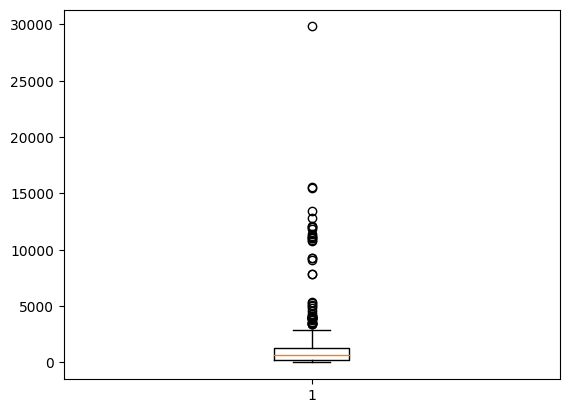

In [209]:
plt.boxplot(traj_pos['duration']);

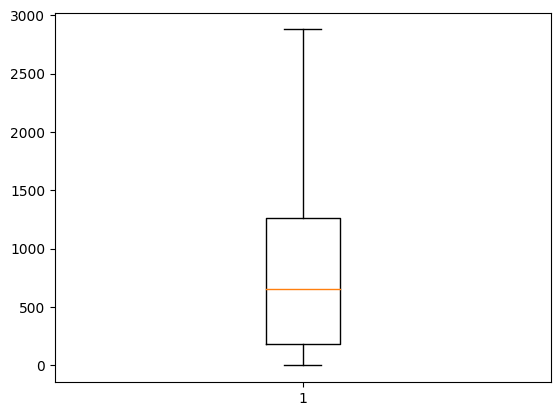

In [210]:
plt.boxplot(traj_pos['duration'],showfliers = False);

We will only the trajectories with duration over the 25% quantile of the dataset durations and with at least 30 positions in each trajectory.

In [211]:
traj_pos= traj_pos[traj_pos['duration'] >= traj_pos['duration'].quantile(0.25)]
traj_pos = traj_pos[traj_pos['segments'].apply(len) > 20]
traj_pos.reset_index(drop = True,inplace=True)
traj_pos

,trajectory_id,vessel_id,start_time,end_time,status,segments,duration
0,35481,490201f75b5ddc3766b08b79c84ff3ff6f3737c31a8906...,2019-08-16 10:06:03,2019-08-16 15:52:11,0,id_x ...,346.133333
1,69697,bfca0e846b6d35f8fde7611da7ff55835ba71a7eda53d3...,2019-08-08 15:41:05,2019-08-08 19:08:22,0,id_x ...,207.283333
2,13729,11e59aaa59860630711db1173860c9b322292d9da5a331...,2019-08-06 18:37:18,2019-08-07 08:51:50,0,id_x ...,854.533333
3,69743,bfca0e846b6d35f8fde7611da7ff55835ba71a7eda53d3...,2019-08-17 15:36:44,2019-08-17 18:54:36,0,id_x ...,197.866667
4,62385,aa42d53ba2d4bd0cc50cb096190a4312347569661f629b...,2019-08-12 20:18:38,2019-08-16 07:31:36,0,id_x ...,4992.966667
...,...,...,...,...,...,...,...
440,4424,08532cbd7297e77dca5c6d333376e2eb13ef3475cac18b...,2019-08-07 17:39:21,2019-08-08 14:41:45,0,id_x ...,1262.400000
441,69699,bfca0e846b6d35f8fde7611da7ff55835ba71a7eda53d3...,2019-08-09 09:21:36,2019-08-09 12:44:54,0,id_x ...,203.300000
442,41812,5de00399a2fdba5f2eb761a622a79a73af9d4058d51e6b...,2019-08-07 17:36:52,2019-08-07 20:55:48,0,id_x ...,198.933333
443,41818,5de00399a2fdba5f2eb761a622a79a73af9d4058d51e6b...,2019-08-09 15:42:00,2019-08-09 19:06:48,0,id_x ...,204.800000


Now we will apply a timestamp in seconds for every position in every trajectory in order to then use it to calclulate velocity, interpolated dt etc.

In [212]:
from datetime import datetime

def create_seconds(segment):
    epoch_time = datetime(1970, 1, 1)
    segment['time_sec'] = (segment['t'] - epoch_time).dt.total_seconds()
    return segment

In [213]:
for segment in traj_pos['segments']:
    segment = create_seconds(segment)

Example of a trajectory segment:

In [214]:
traj_pos.loc[5,'segments'].head()

,id_x,vessel_id,t,heading,course,speed,distance_in_meters,Δs,Δt,velocity,velocity in knots,type,speed_max,Status,port_code,geometry,longitude,latitude,time_sec
2950846,3234515,cc41d3f249146e80540771912150e3e009ce3aa631ca9f...,2019-08-27 16:06:34,235.0,234.0,10.3,2350.469385,42.793626,12.0,3.566136,6.932013,69,25,0,NaN,POINT (466602.316 4198696.712),466602.316253,4.198697e+06,1.566922e+09
2950847,3234551,cc41d3f249146e80540771912150e3e009ce3aa631ca9f...,2019-08-27 16:06:42,234.0,234.0,10.5,2409.851099,62.755089,8.0,7.844386,15.248267,69,25,0,NaN,POINT (466551.201 4198660.305),466551.201440,4.198660e+06,1.566922e+09
2950848,3234626,cc41d3f249146e80540771912150e3e009ce3aa631ca9f...,2019-08-27 16:07:03,229.0,230.0,10.6,2513.677100,110.243383,21.0,5.249685,10.204571,69,25,0,NaN,POINT (466463.057 4198594.091),466463.057345,4.198594e+06,1.566922e+09
2950849,3234706,cc41d3f249146e80540771912150e3e009ce3aa631ca9f...,2019-08-27 16:07:22,222.0,223.0,10.5,2606.624166,102.299347,19.0,5.384176,10.466001,69,25,0,NaN,POINT (466388.079 4198524.496),466388.079342,4.198524e+06,1.566922e+09
2950850,3234747,cc41d3f249146e80540771912150e3e009ce3aa631ca9f...,2019-08-27 16:07:34,218.0,219.0,10.4,2644.928156,44.146112,12.0,3.678843,7.151098,69,25,0,NaN,POINT (466358.945 4198491.329),466358.944751,4.198491e+06,1.566922e+09


Reset the indexes:

In [215]:
for segment in traj_pos['segments']:
    segment.reset_index(drop=True, inplace=True)

**We can see that in every trajectory there is a Δt that is very big. This is due to the loss of the signal near Aigina Island. So we want to split every existing trajectory into 2 sub trajectories (1 heading south and 1 north).**

In [433]:
maxes = []
for segment in traj_pos['segments']:
    maxes.append(segment['Δt'].max())

np.max(maxes)

16427.0

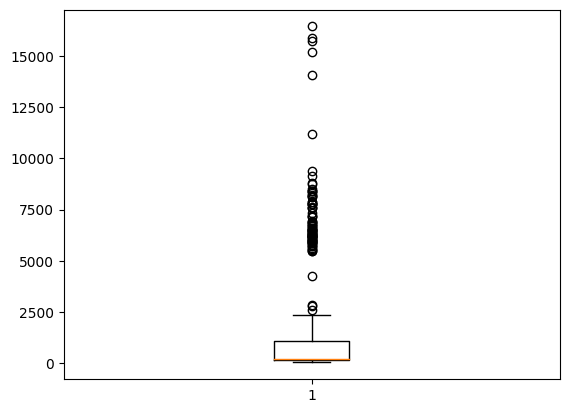

In [434]:
max_dt = []
for i in range(len(traj_pos)):
    max_dt.append(max(traj_pos.loc[i,'segments']['Δt'].value_counts().keys()))

plt.boxplot(max_dt, showfliers=True);

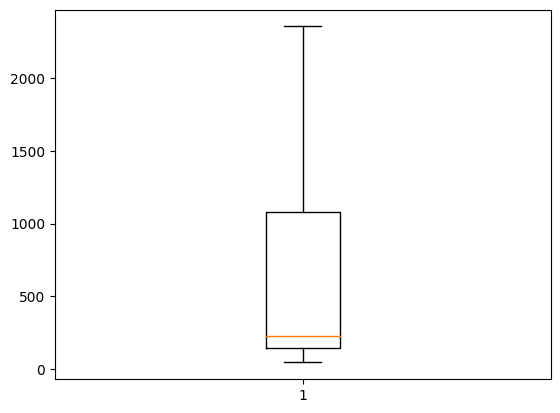

In [435]:

plt.boxplot(max_dt, showfliers=False);

In [436]:
np.mean(max_dt)

1665.8696629213482

Recalculate the time difference between the timestamps for every segment and set the first dt = 0 :

In [220]:
for segment in traj_pos['segments']:
    segment['dt'] = segment['time_sec'].diff()

In [221]:
for segment in traj_pos['segments']:
    segment.loc[0,'dt'] = 0

Let's check 1 random trajectory - segment:

In [437]:
import random
idx = random.randint(0,len(traj_pos)-1)
random_segment = traj_pos.loc[idx,'segments']
gdf_temp = gpd.GeoDataFrame(random_segment, geometry=gpd.points_from_xy(random_segment.loc[:,'longitude'], random_segment.loc[:,'latitude']), crs=2100)
gdf_temp[['time_sec','dt','id_x','geometry']].explore()

As the map indicates, when the vessel was leaving from Piraeus heading south, we lost its signals. The signals returned when it was heading back to Piraeus 17363 seconds after the previous signal! **Here comes the need to split every trajectory into 2 subtrajectories (1 moving away from Piraeus and 1 moving to Piraeus) because this happens to all of our trajectories.**

In [223]:
new_segs = []
threshold = 300 # 5 minutes without signal -> split the trajectory (don't interpolate in other words)
for seg in traj_pos['segments']:

    idx_sep = list(seg[seg['dt'] > threshold].index)
    
    start = 0
    counter = 0
    for i in range(len(idx_sep)):
        end = idx_sep[i]
        new_segs.append(seg.iloc[start:end])
        start = end
        counter += 1
        if counter == len(idx_sep):
            new_segs.append(seg.iloc[start:])


    

In [228]:
new_traj_data = pd.DataFrame(new_segs,columns=['segments'])

In [229]:
new_traj_data

,segments
0,id_x ...
1,id_x ...
2,id_x ...
3,id_x ...
4,id_x ...
...,...
1033,id_x ...
1034,id_x ...
1035,id_x ...
1036,id_x ...


In [230]:
df_traj = new_traj_data[new_traj_data['segments'].apply(len) > 20]
df_traj.reset_index(inplace=True,drop = True)
df_traj


,segments
0,id_x ...
1,id_x ...
2,id_x ...
3,id_x ...
4,id_x ...
...,...
844,id_x ...
845,id_x ...
846,id_x ...
847,id_x ...


Let's check again a random trajectory-segment:

In [231]:
idx = random.randint(0,len(df_traj)-1)
random_segment = df_traj.loc[idx,'segments']
gdf_temp = gpd.GeoDataFrame(random_segment, geometry=gpd.points_from_xy(random_segment.loc[:,'longitude'], random_segment.loc[:,'latitude']), crs=2100)
gdf_temp[['time_sec','course','dt','id_x','geometry']].explore()

So we can see that now we have a single real trajectory and not 2 subtrajectories inside 1. Now reset again the indexes.

In [232]:
for segment in df_traj['segments']:
    segment.reset_index(drop=True, inplace= True)

**We will split the dataset to training and test. The training dataset will be the 80% of the trajectories of the vessel and the test dataset will be the remaining 20% trajectories**

In [233]:
sep = int(len(df_traj)*0.75)
traj_train = df_traj[:sep]
traj_test = df_traj[sep:]
traj_train

,segments
0,id_x ...
1,id_x ...
2,id_x ...
3,id_x ...
4,id_x ...
...,...
631,id_x ...
632,id_x ...
633,id_x ...
634,id_x ...


# Prepairing Data for the Model.

We will start by creating the following generators and functions:

- **get_segments**: we will use this generator to iritate through the sub-trajectories and not having them loaded on memory.

- **calculate_distance**: It calclulates the Euclidean Distance between two points in EPGS 2100

- **interpolate** : We will use this function to apply linear interpolation in order to have synchronized timestamps timestamps

- **calculate_dt**: It calculates the time difference between two signals/timestamps.

- **balance_trajectories**: It is the function that returns the trajectory positions balanced, with synchronized timestamps 

The features we will are the following:

- **lon** - Longitude

- **lat** - Latitude

- **timestamp** - Timestamp

- **velocity** - Speed of vessels in that timestamp calclulated in m/s

- **distance** - The distance of the vessel from its previous position

- **distance_AIS** - The distance of the vessel from the Antenna (University of Piraeus)

Here are the University of Piraues coordinates that we will use for our antenna distance calclulation:

**University of Piraeus in EPGS:4326** (23.647269,37.9438708)

**University of Piraeus in EPGS:2100** (468857.80056930066,4199358.117602245)

In [234]:
unipi = [468857.80056930066,4199358.117602245]

In [235]:
def calculate_distance(x1,x2,y1,y2):
    return np.sqrt((x2-x1)**2 + (y2-y1)**2)

In [396]:
def interpolate(source,target,dt,unipi):
    x1 = source.lon
    y1 = source.lat

    x2 = target.longitude
    y2 = target.latitude

    t1 = source.timestamp
    t2 = target.time_sec
    
    t = t1 + dt
    a = (t-t1)/(t2-t1)

    lon = x1 + (a*(x2-x1))
    lat = y1 + (a*(y2-y1))

    new_time = t1 + dt
    new_distance = calculate_distance(x1,lon,y1,lat)

    new_velocity = new_distance/(new_time-t1)

    dist_from_uni = calculate_distance(lon,unipi[0],lat,unipi[1])

    #The course of the interpolated signal will be equal to the course of the next signal, because linear interpolation assumes that we are moving on a straight line
    new_course = target.course

    return lon, lat, new_time, new_velocity,new_distance, dist_from_uni,new_course

In [237]:
def calculate_dt(source,target,df_source,df_target):
    t1 = df_source.loc[source,'timestamp']
    t2 = df_target.loc[target,'time_sec']
    return t2-t1

In [238]:
def balance_trajectories(trajectories,idx,my_dt,unipi):
    
    #Initialize the sub dfs
    real_segment = trajectories.loc[idx,'segments']
    
    df_balanced = pd.DataFrame()
    df_balanced.loc[0,'lon'] = real_segment.loc[0,'longitude']
    df_balanced.loc[0,'lat'] = real_segment.loc[0,'latitude']
    df_balanced.loc[0,'timestamp'] = real_segment.loc[0,'time_sec']
    df_balanced.loc[0,'velocity'] = real_segment.loc[0,'velocity']
    df_balanced.loc[0,'distance'] = real_segment.loc[0,'Δs']
    df_balanced.loc[0,'distance_AIS'] = real_segment.loc[0,'distance_in_meters']
    df_balanced.loc[0,'course'] = real_segment.loc[0,'course']
    

    #Then we apply the linear interpolation

    #Here is the logic of the algorithm:
    #If the the dt between the points is equal to my_dt, take the original next point
    #Elif dt > my dt, interpolate and generate points until it becomes <= to my_dt
    #Else if dt < my dt, skip that point

    i = 0
    row = 1
    while row <= len(real_segment)-1:
        if calculate_dt(i,row,df_balanced,real_segment) == my_dt:
            i+= 1
            new_lon, new_lat, new_time , new_vel, new_ais, new_course = real_segment.loc[row,'longitude'],real_segment.loc[row,'latitude'], real_segment.loc[row,'time_sec'], real_segment.loc[row,'velocity'],real_segment.loc[row,'distance_in_meters'],real_segment.loc[row,'course']
            df_balanced.loc[i,'lon'],df_balanced.loc[i,'lat'],df_balanced.loc[i,'timestamp'],df_balanced.loc[i,'velocity'],df_balanced.loc[i,'distance_AIS'], df_balanced.loc[i,'course'] = new_lon, new_lat, new_time , new_vel, new_ais, new_course
            new_dist = calculate_distance(df_balanced.loc[i-1,'lon'],df_balanced.loc[i,'lon'],df_balanced.loc[i-1,'lat'],df_balanced.loc[i,'lat'])
            df_balanced.loc[i,'distance'] = new_dist
            row += 1      
        elif calculate_dt(i,row,df_balanced,real_segment) > my_dt:
            i+= 1
            df_balanced.loc[i,'lon'],df_balanced.loc[i,'lat'],df_balanced.loc[i,'timestamp'],df_balanced.loc[i,'velocity'],df_balanced.loc[i,'distance'],df_balanced.loc[i,'distance_AIS'],df_balanced.loc[i,'course'] = interpolate(df_balanced.iloc[i-1],real_segment.iloc[row],my_dt,unipi)
            if calculate_dt(i,row,df_balanced,real_segment) < my_dt:
                row +=1
        else:
            row +=1
    return df_balanced
            

Let's apply these functions to balance traj_train and traj_test datasets by setting **my_dt = 30**:

In [248]:
balanced_dfs = []
my_dt = threshold//10 #This means that we will have a maximum of 10 interpolated successive points
for idx in range(len(traj_train)):
    df_balanced = balance_trajectories(traj_train,idx,my_dt,unipi)
    balanced_dfs.append(df_balanced)

traj_train['new_segments'] = balanced_dfs
traj_train

,segments,new_segments
0,id_x ...,lon lat timestamp ...
1,id_x ...,lon lat timestamp...
2,id_x ...,lon lat timestamp...
3,id_x ...,lon lat timestamp...
4,id_x ...,lon lat timestamp ...
...,...,...
631,id_x ...,lon lat timestamp ...
632,id_x ...,lon lat timestamp ...
633,id_x ...,lon lat timestamp...
634,id_x ...,lon lat timestamp ...


Let's check the correlations of the features in a random segment:

In [249]:
traj_train.loc[250,'new_segments'].corr()

,lon,lat,timestamp,velocity,distance,distance_AIS,course
lon,1.000000,0.979068,0.994258,0.157802,-0.170102,-0.994617,-0.766006
lat,0.979068,1.000000,0.995208,0.112921,-0.146216,-0.994857,-0.783316
timestamp,0.994258,0.995208,1.000000,0.135171,-0.158576,-0.999968,-0.777119
velocity,0.157802,0.112921,0.135171,1.000000,-0.839211,-0.135828,-0.011158
distance,-0.170102,-0.146216,-0.158576,-0.839211,1.000000,0.159030,0.043576
distance_AIS,-0.994617,-0.994857,-0.999968,-0.135828,0.159030,1.000000,0.779514
course,-0.766006,-0.783316,-0.777119,-0.011158,0.043576,0.779514,1.000000


And do the same for the test dataset:

In [250]:
traj_test.reset_index(drop= True, inplace= True)

In [251]:
balanced_dfs = []
for idx in range(len(traj_test)):
    df_balanced = balance_trajectories(traj_test,idx,my_dt,unipi)
    balanced_dfs.append(df_balanced)

traj_test['new_segments'] = balanced_dfs
traj_test

,segments,new_segments
0,id_x ...,lon lat timestamp ...
1,id_x ...,lon lat timestamp...
2,id_x ...,lon lat timestamp ...
3,id_x ...,lon lat timestamp ...
4,id_x ...,lon lat timestamp ...
...,...,...
208,id_x ...,lon lat timestamp ...
209,id_x ...,lon lat timestamp ...
210,id_x ...,lon lat timestamp ...
211,id_x ...,lon lat timestamp ...


**And let's now plot a balanced trajectory on the Saronic Bay Map:**

In [416]:
idx = random.randint(0,len(traj_test)-1)
random_segment = traj_test.loc[idx,'new_segments']
gdf_balanced = gpd.GeoDataFrame(random_segment, geometry=gpd.points_from_xy(random_segment.iloc[:,0], random_segment.iloc[:,1]), crs=2100)
gdf_balanced[['timestamp','course','distance','geometry']].explore()

We can now see the smootheness of our trajectory because of the linear interpolation we applied to it. **Now every signal comes exactly every 30 seconds.**

# Create mini-trajectories for the model input

It is now time to create the mini trajectories for the model input. The structure will be:

- **Split the big trajectories into time windowed trajectories sized of T.**

- **The time windowed trajectory sized T will be the input X of the model.**

- **The target Y of our probelm will be the exact position on T + 1 time, that is 1 timestamp in the future than the last timestamp of the input.**

**X** should be of **shape (N,T,D)** where we have:
- **N different mini trajectories**
- **each sized T**
- **with D features.**

We will set **D to be equal to 4**, because we will use 2 features to our model:

- **lon**

- **lat**

- **distance**

- **course**


Firstly, create the training dataset.

In [351]:
X_train = [] #Array with every mini trajectory input init
Y_train = [] #2D Array with the targets [lon,lat]
T = 14 #Time window
D = 4 #Number of dimensions

for df_balanced in traj_train['new_segments']:
    df_balanced = df_balanced[['lon','lat','distance','course']]
    df_balanced.loc[0,'distance'] = 0
    for t in range(0,len(df_balanced) - T):
        X_train.append(df_balanced.iloc[t:t+T])
        Y_train.append(df_balanced.loc[t+T,['lon','lat','distance','course']])
    

N = len(X_train)
X_train = np.array(X_train)
Y_train = np.array(Y_train)
X_train.shape, Y_train.shape

((33927, 14, 4), (33927, 4))

In [352]:
X_train.shape

(33927, 14, 4)

We have 16,876 12-timestamp-windowed time series of lons, lats, distances and courses that we will use to train the model.

We will **scale the data as have different ranges in them**.

In [353]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(X_train.reshape(-1, X_train.shape[-1]))
X_train_scaled = scaler.transform(X_train.reshape(-1, X_train.shape[-1])).reshape(X_train.shape)
X_train_scaled.shape



(33927, 14, 4)

In [354]:
Y_train_scaled = scaler.transform(Y_train.reshape(-1, Y_train.shape[-1])).reshape(Y_train.shape)
Y_train_scaled

array([[0.5800841 , 0.9236577 , 0.56121133, 0.59683245],
       [0.57526886, 0.91814641, 0.5635853 , 0.59433176],
       [0.57043764, 0.91262502, 0.5648877 , 0.5940539 ],
       ...,
       [0.63829921, 0.97594037, 0.77360983, 0.97804946],
       [0.63903134, 0.98386724, 0.66937387, 0.0111142 ],
       [0.64254135, 0.99016263, 0.5791435 , 0.06668519]])

Now just keep as target the lons and lats:

In [355]:
Y_train_scaled = Y_train_scaled[:,:2]

Do the similar procedure our test dataset.

In [356]:
X_test = [] 
Y_test = []
for df_balanced in traj_test['new_segments']:
    df_balanced = df_balanced[['lon','lat','distance','course']]
    df_balanced.loc[0,'distance'] = 0
    for t in range(0,len(df_balanced) - T):
        X_test.append(df_balanced.iloc[t:t+T])
        Y_test.append(df_balanced.loc[t+T,['lon','lat','distance','course']])
    

N = len(X_test)
X_test = np.array(X_test)
Y_test = np.array(Y_test)
X_test.shape, Y_test.shape

((10926, 14, 4), (10926, 4))

**AND USE THE SCALER OF THE TRAIN DATASET TO TRANSFORM THE DATA!**

In [357]:
X_test_scaled = scaler.transform(X_test.reshape(-1, X_test.shape[-1])).reshape(X_test.shape)
X_test_scaled.shape

(10926, 14, 4)

In [358]:
Y_test_scaled = scaler.transform(Y_test.reshape(-1, Y_test.shape[-1])).reshape(Y_test.shape)
Y_test_scaled.shape

(10926, 4)

In [359]:
Y_test_scaled = Y_test_scaled[:, :2]

In [360]:
import tensorflow as tf
import shapely as shp

As we have a location prediction, where all the coordinates are in meters, it is more appropriate to use root mean squared error as a loss function because it calclulates the Euclidian distance between to vertices (Y_true,Y_pred).

In [361]:
def root_mean_squared_error(y_true, y_pred):
        return tf.keras.backend.sqrt(
                tf.keras.backend.mean(
                        tf.keras.backend.square(
                                y_pred - y_true
                        )
                ) + 
                1e-9
        ) 

In our Neural Network Structure, we will use **Bidirectional GRU**. This will help the model understand the trajectory structure better and get better results.

In [380]:
model = tf.keras.Sequential(
    [
        tf.keras.layers.Input(shape=(X_train_scaled.shape[1], X_train_scaled.shape[2])),
        tf.keras.layers.Bidirectional(tf.keras.layers.GRU(28,activation= 'tanh', recurrent_dropout= 0.1, kernel_regularizer= 'l2')),     
        tf.keras.layers.Dense(2),
    ]
)

model.compile(loss=root_mean_squared_error, optimizer=tf.keras.optimizers.Adam(learning_rate = 0.01, clipvalue=1.0))
model.summary()

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_19 (Bidirecti  (None, 56)               5712      
 onal)                                                           
                                                                 
 dense_24 (Dense)            (None, 2)                 114       
                                                                 
Total params: 5,826
Trainable params: 5,826
Non-trainable params: 0
_________________________________________________________________


Also we will use a Learning Rate Scheduler, in order to reduce the learning rate through the training and achieve more accurate results.

In [381]:
from tensorflow.keras.callbacks import LearningRateScheduler

def lr_schedule(epoch):
    initial_lr = 0.01 
    drop = 0.5 
    epochs_drop = 5

    lr = initial_lr * (drop ** (epoch // epochs_drop))
    
    return lr

#This means that the lr drops at half every 2 epochs.

lr_scheduler = LearningRateScheduler(lr_schedule)

Let's fit the model.

In [382]:
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=20)
history = model.fit(
    x = X_train_scaled,
    y = Y_train_scaled,
    epochs=300,
    batch_size= 16,
    callbacks=[lr_scheduler,early_stop],
    verbose=1,
    validation_data=(X_test_scaled,Y_test_scaled)
)

Epoch 1/300


2121/2121 [==============================] - 27s 12ms/step - loss: 0.0290 - val_loss: 0.0238 - lr: 0.0100
Epoch 2/300
2121/2121 [==============================] - 24s 11ms/step - loss: 0.0173 - val_loss: 0.0169 - lr: 0.0100
Epoch 3/300
2121/2121 [==============================] - 24s 11ms/step - loss: 0.0149 - val_loss: 0.0171 - lr: 0.0100
Epoch 4/300
2121/2121 [==============================] - 24s 11ms/step - loss: 0.0136 - val_loss: 0.0170 - lr: 0.0100
Epoch 5/300
2121/2121 [==============================] - 25s 12ms/step - loss: 0.0137 - val_loss: 0.0094 - lr: 0.0100
Epoch 6/300
2121/2121 [==============================] - 24s 12ms/step - loss: 0.0083 - val_loss: 0.0059 - lr: 0.0050
Epoch 7/300
2121/2121 [==============================] - 25s 12ms/step - loss: 0.0083 - val_loss: 0.0072 - lr: 0.0050
Epoch 8/300
2121/2121 [==============================] - 24s 12ms/step - loss: 0.0080 - val_loss: 0.0093 - lr: 0.0050
Epoch 9/300
2121/2121 [==============================] - 25s 12ms/st

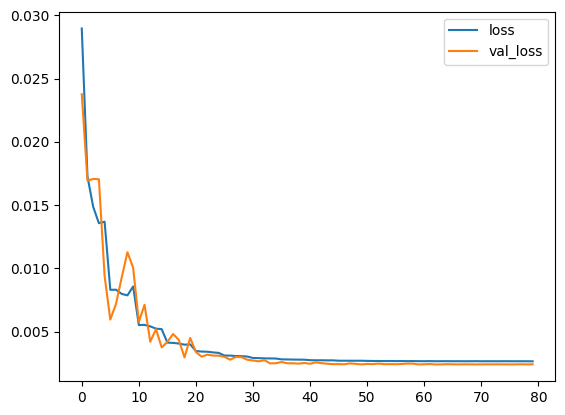

In [383]:
plt.plot(history.history['loss'], label= 'loss')
plt.plot(history.history['val_loss'], label= 'val_loss')
plt.legend()
plt.show()

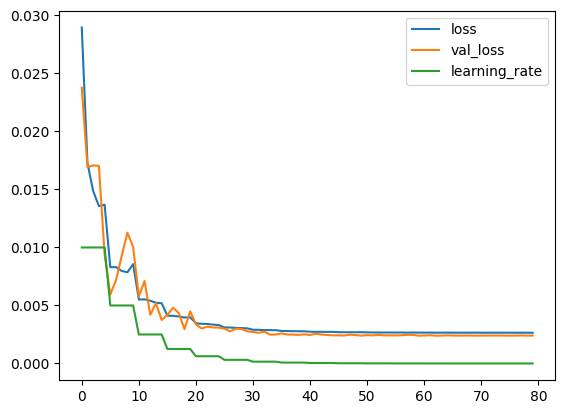

In [384]:
plt.plot(history.history['loss'], label= 'loss')
plt.plot(history.history['val_loss'], label= 'val_loss')
plt.plot(history.history['lr'], label= 'learning_rate')
plt.legend()
plt.show()

We can see that the training was good, as epochs passed we managed to minimize the validation loss and training loss and stop before the model starts overfitting. Using the learning rate scheduler helped a lot to manage to approach the global minimum point of the loss function and keep improving through training.

Let's evaluate our model by bringing back the features to their original sizes.

In [418]:
y_pred = model(X_test_scaled)

In [419]:
inversed_y_pred_4d = scaler.inverse_transform(np.concatenate([y_pred, np.zeros((y_pred.shape[0], 2))], axis=1))
inversed_y_pred_2d = inversed_y_pred_4d[:, :2]
inversed_y_pred_2d

array([[ 465125.33727661, 4196294.46274102],
       [ 465037.58953171, 4196109.87367986],
       [ 464947.32237681, 4195929.54353052],
       ...,
       [ 465996.07688809, 4198358.25318849],
       [ 466176.58036895, 4198487.19391703],
       [ 466364.02892633, 4198609.69195497]])

In [438]:
rmse = root_mean_squared_error(Y_test[:,:2],inversed_y_pred_2d).numpy() #T = 12
print(f" Test RMSE for GRU with window T= 14 and features D = {D} is {rmse} meters.")

 Test RMSE for GRU with window T= 14 and features D = 4 is 24.168679306936586 meters.


In [427]:
y_pred_train = model(X_train_scaled)
inversed_y_pred_4d_train = scaler.inverse_transform(np.concatenate([y_pred_train, np.zeros((y_pred_train.shape[0], 2))], axis=1))
inversed_y_pred_2d_train = inversed_y_pred_4d_train[:, :2]
inversed_y_pred_2d_train

array([[ 464599.87158789, 4196087.32534922],
       [ 464455.68631855, 4195883.09966244],
       [ 464314.72781226, 4195680.74920062],
       ...,
       [ 466157.86377308, 4197942.74201671],
       [ 466127.48013373, 4198273.6855408 ],
       [ 466313.85824159, 4198544.13296069]])

In [428]:
rmse = root_mean_squared_error(Y_train[:,:2],inversed_y_pred_2d_train).numpy()
print(f" Train RMSE for GRU with window T= 14 and features D = {D} is {rmse} meters.")

 Train RMSE for GRU with window T= 14 and features D = 4 is 24.840520124415917 meters.


The Euclidean Distance of our Prediction Array and the True Array for the Test Datset is only 24.16 meters away, which is very pleasant. Lastly let's plot on the map the predictions of our model with the red point, the true target with blue, and the input given with the black points.

In [388]:
length = len(X_test)

In [389]:
idx = random.randint(0,length)
tmp_traj = X_test[idx]
tmp_traj = gpd.GeoDataFrame(tmp_traj, geometry=gpd.points_from_xy(tmp_traj[:,0], tmp_traj[:,1]), crs=2100)

tmp_y_true = gpd.GeoSeries(shp.geometry.Point(*Y_test[idx,:2].tolist()), crs=2100)
tmp_y_pred = gpd.GeoSeries(shp.geometry.Point(*inversed_y_pred_2d[idx]), crs=2100)
m = tmp_traj.rename({0:'lon', 1:'lat', 2:'velocity',3:'distance',4: 'distance_AIS', 5: 'saf'},axis=1).explore(color='black')
gpd.GeoSeries(tmp_y_true, crs=2100).explore(m=m, color='blue')
gpd.GeoSeries(tmp_y_pred, crs=2100).explore(m=m, color='red')

In [390]:
idx = random.randint(0,length)
tmp_traj = X_test[idx]
tmp_traj = gpd.GeoDataFrame(tmp_traj, geometry=gpd.points_from_xy(tmp_traj[:,0], tmp_traj[:,1]), crs=2100)

tmp_y_true = gpd.GeoSeries(shp.geometry.Point(*Y_test[idx,:2].tolist()), crs=2100)
tmp_y_pred = gpd.GeoSeries(shp.geometry.Point(*inversed_y_pred_2d[idx]), crs=2100)
m = tmp_traj.rename({0:'lon', 1:'lat', 2:'velocity',3:'distance',4: 'distance_AIS'},axis=1).explore(color='black')
gpd.GeoSeries(tmp_y_true, crs=2100).explore(m=m, color='blue')
gpd.GeoSeries(tmp_y_pred, crs=2100).explore(m=m, color='red')

In [391]:
idx = random.randint(0,length)
tmp_traj = X_test[idx]
tmp_traj = gpd.GeoDataFrame(tmp_traj, geometry=gpd.points_from_xy(tmp_traj[:,0], tmp_traj[:,1]), crs=2100)

tmp_y_true = gpd.GeoSeries(shp.geometry.Point(*Y_test[idx,:2].tolist()), crs=2100)
tmp_y_pred = gpd.GeoSeries(shp.geometry.Point(*inversed_y_pred_2d[idx]), crs=2100)
m = tmp_traj.rename({0:'lon', 1:'lat', 2:'velocity',3:'distance',4: 'distance_AIS', 5: 'saf'},axis=1).explore(color='black')
gpd.GeoSeries(tmp_y_true, crs=2100).explore(m=m, color='blue')
gpd.GeoSeries(tmp_y_pred, crs=2100).explore(m=m, color='red')

In [392]:
idx = random.randint(0,length)
tmp_traj = X_test[idx]
tmp_traj = gpd.GeoDataFrame(tmp_traj, geometry=gpd.points_from_xy(tmp_traj[:,0], tmp_traj[:,1]), crs=2100)

tmp_y_true = gpd.GeoSeries(shp.geometry.Point(*Y_test[idx,:2].tolist()), crs=2100)
tmp_y_pred = gpd.GeoSeries(shp.geometry.Point(*inversed_y_pred_2d[idx]), crs=2100)
m = tmp_traj.rename({0:'lon', 1:'lat', 2:'velocity',3:'distance',4: 'distance_AIS', 5: 'saf'},axis=1).explore(color='black')
gpd.GeoSeries(tmp_y_true, crs=2100).explore(m=m, color='blue')
gpd.GeoSeries(tmp_y_pred, crs=2100).explore(m=m, color='red')

Save the model.

In [395]:
model.save('passenger_model.h5')